Based upon Kaggle notebook: "Topic Modeling in NLP with ABC news sample"

<a href="https://colab.research.google.com/github/jon-chun/GenAI-Multi-Agent-Networks-and-Digital-Twins/blob/main/code/notebooks/nlp_Topic_Modeling_in_NLP_with_ABC_news_sample_20241110.ipynb" target="_blank">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab"/>
</a>


In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
bansodesandeep_abc_news_sample_path = kagglehub.dataset_download('bansodesandeep/abc-news-sample')

print('Data source import complete.')


100%|██████████| 427k/427k [00:00<00:00, 21.1MB/s]

Extracting files...
Data source import complete.



<div style="padding:20px;
            color:#150d0a;
            margin:10px;
            font-size:220%;
            text-align:center;
            display:fill;
            border-radius:20px;
            border-width: 5px;
            border-style: solid;
            border-color: #150d0a;
            background-color:#eca912;
            overflow:hidden;
            font-weight:500">Topic Modeling in NLP with ABC news sample</div>
<center>
<img src="https://dkk4qeqny48s0.cloudfront.net/wp-content/uploads/2021/07/MNLP.jpg" width=600>
</center>
            

# <font color='289C4E'>Table of contents<font><a class='anchor' id='top'></a>
1. [ Problem Understanding](#Problem)
2. [ Data Exploration](#Exploration)
3. [Data Preprocessing](#Preprocessing)
4. [LDA-model](#LDA)
5. [BERTopic](#BERTopic)
6. [GSDM](#GSDM)
7. [Non-negative Matrix Factorization (NMF)](#NMF)


> If you found this notebook valuable, I'd appreciate your upvote!
>

<a id="Problem"></a>

# <div style="background-color: #FF5733; font-family: 'Gill Sans', sans-serif; font-size: 36px; color: #ffffff; text-align: center; border-radius: 20px; padding: 20px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2);"><b>1. Problem Understanding</b></div>


## What is Topic Modeling?

* Unsupervised learning method.
* Groups similar words into "topics" from text data.

## Why use it?

* Helps summarize large texts by finding hidden themes.
* Useful when you don't know what the text talks about.

## Example

Imagine a bunch of news articles. Some talk about sports, others about politics, and some about technology. Topic modeling automatically finds these themes.

### Simple Example:
You have this text:

* "Football is exciting."
* "The election is coming."
* "Tech companies are growing."

## Topics:

* Sports → "Football"
* Politics → "Election"
* Technology → "Tech companies"

## Why it's cool?

* Saves time.
* Helps organize and understand text.

## LDA (Latent Dirichlet Allocation)

* Why: It’s great for understanding the hidden structure in large text datasets by grouping words into topics.
* When: Use when you want to discover broad themes or topics in a set of documents. It works well when you have unstructured text and need a simple, interpretable model.
* Example: Given 100 news articles, LDA can identify topics like "politics," "sports," or "technology" based on word patterns.

## BERTopic

* Why: It combines BERT embeddings with topic modeling, offering more nuanced and contextual topics. It can also handle dynamic topics over time.
* When: Use when you want topics that capture deeper meanings in sentences (e.g., sarcasm, sentiment). Good for complex, contextual text analysis.
* Example: Analyzing social media posts where the context of a sentence is critical to understanding the topic (e.g., "this product is the bomb!" ≠ explosion).

## GSDM (Gibbs Sampling Dirichlet Mixture)

* Why: Similar to LDA but uses Gibbs Sampling for more flexible topic discovery.
* When: Use for topic discovery when you need more control over the topic generation process, especially in custom or academic research.
* Example: Grouping research papers by subject but needing more specific topic modeling methods beyond LDA.

## NMF (Non-negative Matrix Factorization)

* Why: Focuses on parts of the data, leading to cleaner, more distinct topics.
* When: Use when topics should be sharply divided and non-overlapping. It's also faster than LDA.
* Example: Sorting customer reviews into topics like “product quality,” “service issues,” or “shipping problems,” where each review is mostly about one specific issue.

<a id="Exploration"></a>

# <div style="background-color: #FF5733; font-family: 'Gill Sans', sans-serif; font-size: 36px; color: #ffffff; text-align: center; border-radius: 20px; padding: 20px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2);"><b>  2.  Data Exploration </b></div>


## Install necessary libraries

In [2]:
!pip install bertopic


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.7/143.7 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 48.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.0 MB/s eta 0:00:00


In [3]:
!pip install spacy

In [4]:
!pip install git+https://github.com/rwalk/gsdmm.git

  Cloning https://github.com/rwalk/gsdmm.git to /tmp/pip-req-build-bgnogbnz
  Running command git clone --filter=blob:none --quiet https://github.com/rwalk/gsdmm.git /tmp/pip-req-build-bgnogbnz
  Resolved https://github.com/rwalk/gsdmm.git to commit 4ad1b6b6976743681ee4976b4573463d359214ee
  Preparing metadata (setup.py) ... done
  Created wheel for gsdmm: filename=gsdmm-0.1-py3-none-any.whl size=4588 sha256=3cb18adc586d076d4880e3f760ed2ddbdad6edcb12714802bd29f4a5b2ed11f4
  Stored in directory: /tmp/pip-ephem-wheel-cache-vg7w4ifx/wheels/da/d3/6e/a612d7cff0fcfb6470b8c113fc04931ecffb466ac19b9c5f3c
Successfully built gsdmm


## Importing necessary libraries for data analysis and machine learning model building.


In [5]:
import pandas as pd               # Library for data manipulation and analysis
import numpy as np                # Library for numerical computing
import matplotlib.pyplot as plt   # Library for data visualization
import seaborn as sns             # Library for statistical data visualization
import matplotlib.pyplot as pl

In [6]:
%%time

# NOTE:

from bertopic import BERTopic


In [7]:
import spacy


In [8]:
!pwd

/content


In [9]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [10]:
!pwd

/content


In [11]:
!ls

sample_data


In [12]:
import sys
sys.path.append('../input/gsdmm-short-text-clustering')
from gsdmm import MovieGroupProcess

from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora, models
from gensim.utils import simple_preprocess
import gensim, spacy
from gensim.models.ldamulticore import LdaMulticore
import re


from gensim.models import Phrases
from gensim.models.phrases import Phraser

#### Importing the dataset


In [14]:
!pwd

/content


##### OPTION (A) Upload *.csv file of lines

In [84]:
# prompt: upload a *.csv file into pandas dataframe named df and save the uploaded filename in the var filename_uploaded

from google.colab import files
import pandas as pd
import io

filename_uploaded = ""
uploaded = files.upload()

for fn in uploaded.keys():
  filename_uploaded = fn
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

  df_all = pd.read_csv(io.BytesIO(uploaded[fn]))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Saving book_the-great-gatsby_fsfitzgerald_sentiment_all.csv to book_the-great-gatsby_fsfitzgerald_sentiment_all (2).csv
User uploaded file "book_the-great-gatsby_fsfitzgerald_sentiment_all (2).csv" with length 461456 bytes


In [85]:
df_all.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,line_no,line,sentiment_x,sentiment_y,syuzhetr_syuzhet,syuzhetr_bing,syuzhetr_afinn,syuzhetr_nrc,sentimentr_jockersrinker,sentimentr_jockers,sentimentr_huliu,sentimentr_nrc,sentimentr_senticnet,sentimentr_sentiword,sentimentr_loughran_mcdonald,sentimentr_socal_google,distilbert,nlptown,roberta15lg
0,0,"once again to zelda then wear the gold hat, if...",0.5572,0.050000,0.00,0,-1,1.0,0.275000,0.275000,0.633333,0.466667,1.005533,-0.217014,0.00000,0.247375,1,4,1
1,1,"""whenever you feel like criticizing anyone,"" h...",0.7265,0.500000,1.50,1,5,2.0,-0.086603,-0.086603,-0.346410,0.346410,0.143568,0.072169,-0.34641,-0.275919,1,4,1
2,2,"in consequence, i'm inclined to reserve all ju...",-0.2732,0.085000,0.55,-1,-2,1.0,-0.150000,-0.150000,-0.200000,0.000000,0.728000,0.164583,-0.40000,0.000000,1,1,1
3,3,the abnormal mind is quick to detect and attac...,-0.2960,0.016667,-3.90,-4,0,-4.0,0.259808,0.259808,-0.086603,0.779423,0.389298,0.049315,0.34641,0.000000,0,2,0
4,4,most of the confidences were unsought--frequen...,0.3797,-0.050744,2.65,0,-2,5.0,0.382559,0.346638,0.035921,0.323290,0.260033,0.218894,0.00000,-0.004495,0,1,0


In [86]:
# prompt: copy df_all[['line_no','line']] to a deep copy df[['line_no','headline_text']

df = df_all[['line_no', 'line']].copy(deep=True)
df.rename(columns={'line': 'headline_text'}, inplace=True)
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,line_no,headline_text
0,0,"once again to zelda then wear the gold hat, if..."
1,1,"""whenever you feel like criticizing anyone,"" h..."
2,2,"in consequence, i'm inclined to reserve all ju..."
3,3,the abnormal mind is quick to detect and attac...
4,4,most of the confidences were unsought--frequen...


In [88]:
df.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(1357, 2)

In [89]:
print(df.isnull() .sum())

line_no          0
headline_text    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [90]:
smalldata = df[:100]
smalldata

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,line_no,headline_text
0,0,"once again to zelda then wear the gold hat, if..."
1,1,"""whenever you feel like criticizing anyone,"" h..."
2,2,"in consequence, i'm inclined to reserve all ju..."
3,3,the abnormal mind is quick to detect and attac...
4,4,most of the confidences were unsought--frequen...
...,...,...
95,95,"they were here, and they accepted tom and me, ..."
96,96,they knew that presently dinner would be over ...
97,97,"it was sharply different from the west, where ..."
98,98,"""you make me feel uncivilized, daisy,"" i confe..."


##### **[SKIP]** to **[3. Data Preprocessing]**

##### OPTION (B) Kaggle

In [21]:
# First download kaggle.json authorization file from settings
#   before uploading the file kaggle.json here

import os

# Check if the Kaggle API credentials are available
if os.path.exists('/root/.kaggle/kaggle.json'):
    print("Kaggle API credentials found.")
else:
    print("Kaggle API credentials not found. Please upload your kaggle.json file.")
    from google.colab import files
    uploaded = files.upload()
    if 'kaggle.json' in uploaded:
        !mkdir -p ~/.kaggle
        !mv kaggle.json ~/.kaggle/
        !chmod 600 ~/.kaggle/kaggle.json
        print("Kaggle API credentials uploaded and configured successfully.")
    else:
        print("Kaggle API credentials not uploaded. Please upload the kaggle.json file to proceed.")

# Download the dataset from Kaggle
!kaggle datasets download -d bansodesandeep/abc-news-sample
!unzip abc-news-sample.zip

# Now you can access the downloaded dataset, such as abcnews_sample.csv:
# ... (your code to work with the dataset)

Kaggle API credentials found.
Dataset URL: https://www.kaggle.com/datasets/bansodesandeep/abc-news-sample
License(s): unknown
abc-news-sample.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  abc-news-sample.zip
  inflating: abcnews_sample.csv      


In [19]:
!ls

abcnews_sample.csv  abc-news-sample.zip  sample_data


In [22]:
import pandas as pd

df = pd.read_csv('abcnews_sample.csv')
df.head()

,publish_date,headline_text
0,20050627,lawyer claims aust govt has abandoned corby
1,20051206,singapore tells spouses of patients hiv status
2,20141119,iron ore price slumps to new five year low
3,20060203,youth crime prevention schemes share in funds
4,20190521,harry triguboff speaks to the business


In [87]:
df.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(1357, 2)

In [24]:
print(df.isnull() .sum())

publish_date     0
headline_text    0
dtype: int64


In [25]:
smalldata = df[:100]
smalldata

,publish_date,headline_text
0,20050627,lawyer claims aust govt has abandoned corby
1,20051206,singapore tells spouses of patients hiv status
2,20141119,iron ore price slumps to new five year low
3,20060203,youth crime prevention schemes share in funds
4,20190521,harry triguboff speaks to the business
...,...,...
95,20191219,the wa member of parliament electoral allowanc...
96,20060413,britain to appeal hicks passport decision
97,20080721,patel granted conditional bail
98,20131101,labor negative political climate carbon policy


In [26]:
# Create a new column containing the length each headline text
smalldata["headline_text_len"] = smalldata["headline_text"].apply(lambda x : len(x.split()))

In [27]:
print("The longest headline has: {} words".format(smalldata.headline_text_len.max()))


The longest headline has: 10 words


In [28]:
smalldata['headline_text'] = smalldata.headline_text.values.tolist()
smalldata['headline_text']


,headline_text
0,lawyer claims aust govt has abandoned corby
1,singapore tells spouses of patients hiv status
2,iron ore price slumps to new five year low
3,youth crime prevention schemes share in funds
4,harry triguboff speaks to the business
...,...
95,the wa member of parliament electoral allowanc...
96,britain to appeal hicks passport decision
97,patel granted conditional bail
98,labor negative political climate carbon policy


<a id="Preprocessing"></a>

# <div style="background-color: #FF5733; font-family: 'Gill Sans', sans-serif; font-size: 36px; color: #ffffff; text-align: center; border-radius: 20px; padding: 20px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2);"><b>  3. Data Preprocessing </b></div>


In [91]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [101]:
FULL_FLAG = True

if FULL_FLAG == True:
  # Run full data
  tokens_headline_text = list(sent_to_words(df['headline_text']))
else:
  # Test small data
  tokens_headline_text = list(sent_to_words(smalldata['headline_text']))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [102]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

# I use gensim stop-words and add me own stop-words, based on texts
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in gensim.parsing.preprocessing.STOPWORDS.union(set(['also', 'meanwhile','however', 'time',
                                                                                                                           'hour', 'soon', 'day', 'book',
                                                                                                                           'there', 'hotel', 'room', 'leave',
                                                                                                                           'arrive',
                                                                                                                           'place', 'stay', 'staff', 'location',
                                                                                                                          'service', 'come', 'check',
                                                                                                                          'ask', 'lot', 'thing',
                                                                                                                          'soooo', 'add', 'rarely',
                                                                                                                          'use', 'look', 'minute',
                                                                                                                          'bring', 'need', 'world',
                                                                                                                          'think', 'value', 'include']))] for doc in texts]
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent))
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [103]:
headline_text_lemmatized = lemmatization(tokens_headline_text, allowed_postags=['NOUN', 'VERB', 'ADV'])

# remove stop words after lemmatization
headline_text_lemmatized = remove_stopwords(headline_text_lemmatized)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<a id="LDA"></a>

# <div style="background-color: #FF5733; font-family: 'Gill Sans', sans-serif; font-size: 36px; color: #ffffff; text-align: center; border-radius: 20px; padding: 20px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2);"><b>  4. LDA-model </b></div>


In [104]:
id2word = corpora.Dictionary(headline_text_lemmatized)
texts = headline_text_lemmatized
corpus = [id2word.doc2bow(text) for text in texts]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [96]:
# Use TF-IDF
tfidf = models.TfidfModel(corpus)
corpus_tfidf = tfidf[corpus]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



```markdown
## Instructions to Improve Topic Modeling Clustering in LDA

To achieve better clustering of words in topic modeling, you can adjust various parameters and configurations in the `LdaMulticore` model. Here’s how to refine your approach for improved results:

### 1. Increase the Number of Iterations
   - Increasing iterations gives the model more time to converge on stable topic distributions.
   - Adjust `passes` (full passes over the corpus) and `iterations` (within each document) for a thorough review.

   ```python
   model = LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=num_topics,
                        alpha=0.1, eta=0.1, random_state=42, passes=20, iterations=500)
   ```

### 2. Use Adaptive `alpha` and `eta`
   - Lower values of `alpha` encourage sparsity, while higher values allow multiple topics in each document.
   - Try setting `alpha='auto'` and `eta='auto'` to let the model automatically optimize these hyperparameters.

   ```python
   model = LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=num_topics,
                        alpha='auto', eta='auto', random_state=42, passes=20, iterations=500)
   ```

### 3. Broaden the Range of Topic Numbers
   - Instead of a narrow range (e.g., `start=20`, `limit=30`), explore more options by using a wider range of topics (e.g., from 10 to 50).

   ```python
   model_list, coherence_values = calc_coherence_values(dictionary=id2word, corpus=corpus_tfidf,
                                                        texts=texts, start=10, limit=50, step=5)
   ```

### 4. Increase the Precision of Topic Number Selection
   - Use a smaller `step` (e.g., `step=1`) to pinpoint the ideal number of topics more precisely.

   ```python
   model_list, coherence_values = calc_coherence_values(dictionary=id2word, corpus=corpus_tfidf,
                                                        texts=texts, start=10, limit=30, step=1)
   ```

### 5. Ensure Corpus Size is Adequate and Use TF-IDF Weighting
   - Make sure your corpus is large enough to generalize well.
   - Using `TF-IDF` (as you did with `corpus_tfidf`) prioritizes distinctive terms, aiding in better topic differentiation.

### Final Example of an Enhanced Function Call

Combine the suggestions above into a refined function call:

```python
# Assuming dictionary and corpus_tfidf are already defined
model_list, coherence_values = calc_coherence_values(dictionary=id2word, corpus=corpus_tfidf,
                                                     texts=texts, start=10, limit=50, step=1)
```

This setup will run longer but should yield better clustering and coherence values, resulting in more meaningful topic distributions and word clusters. You can evaluate coherence values to select the best model.
```

In [109]:
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel
from tqdm import tqdm  # Import tqdm for the progress bar

def calc_coherence_values(dictionary, corpus, texts, limit=12, start=1, step=1):
    coherence_values = []
    model_list = []
    # Adding tqdm progress bar
    for num_topics in tqdm(range(start, limit, step), desc="Calculating coherence for topic models"):
        # Create LDA model with specified number of topics
        model = LdaMulticore(corpus=corpus, id2word=dictionary, num_topics=num_topics, alpha=0.1, eta=0.1, random_state=42, iterations=500)
        model_list.append(model)

        # Create coherence model and calculate coherence value
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence = coherencemodel.get_coherence()
        coherence_values.append(coherence)

        # Print the coherence score for each topic number
        print(f'Num Topics: {num_topics}, Coherence Score: {coherence}')

    return model_list, coherence_values

# Example call to the function with a progress bar
model_list, coherence_values = calc_coherence_values(dictionary=id2word, corpus=corpus_tfidf, texts=texts, start=20, limit=30, step=2)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

Calculating coherence for topic models:  20%|██        | 1/5 [00:03<00:13,  3.32s/it]WARNING:gensim.models.ldamulticore:too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy


Num Topics: 20, Coherence Score: 0.39122286582959137


Calculating coherence for topic models:  40%|████      | 2/5 [00:07<00:10,  3.53s/it]WARNING:gensim.models.ldamulticore:too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy


Num Topics: 22, Coherence Score: 0.3633110216283383


Calculating coherence for topic models:  60%|██████    | 3/5 [00:09<00:05,  2.89s/it]WARNING:gensim.models.ldamulticore:too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy


Num Topics: 24, Coherence Score: 0.3468581771323818


Calculating coherence for topic models:  80%|████████  | 4/5 [00:11<00:02,  2.70s/it]WARNING:gensim.models.ldamulticore:too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy


Num Topics: 26, Coherence Score: 0.369725519209743


Calculating coherence for topic models: 100%|██████████| 5/5 [00:13<00:00,  2.67s/it]

Num Topics: 28, Coherence Score: 0.3717914701735015


In [97]:
"""
from gensim.models.ldamulticore import LdaMulticore

def calc_coherence_values(dictionary, corpus, texts, limit = 12, start = 1, step = 1):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaMulticore(corpus=corpus,id2word = dictionary, num_topics = num_topics, alpha=.1, eta=0.1, random_state = 42)
        model_list.append(model)
        print('model created')
        coherencemodel = CoherenceModel(model = model, texts = texts, dictionary = dictionary, coherence = 'c_v')
        print(coherencemodel.get_coherence())
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

model_list, coherence_values = calc_coherence_values(dictionary = id2word, corpus = corpus_tfidf, texts = texts, start = 20, limit = 30, step = 2)
""";

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



model created
0.394105343253625


model created
0.44356179788904343


model created
0.43914556748375794


model created
0.3990131900765069


model created
0.42226120854839616


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



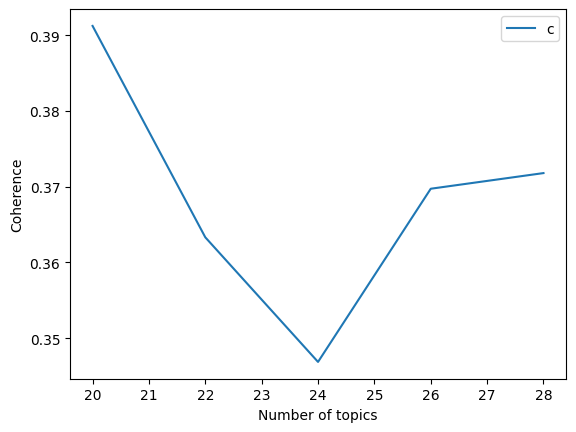

In [112]:
limit, start, step = 30, 20, 2
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Number of topics")
plt.ylabel("Coherence")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [113]:
index = coherence_values.index(max(coherence_values))
model_list[index].show_topics()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



[(18,
  '0.002*"drop" + 0.002*"drink" + 0.002*"grow" + 0.002*"glass" + 0.002*"complain" + 0.002*"evidently" + 0.002*"movement" + 0.002*"surprise" + 0.001*"run" + 0.001*"yawn"'),
 (1,
  '0.002*"frown" + 0.002*"candle" + 0.002*"dissimilarity" + 0.002*"shape" + 0.002*"size" + 0.002*"wingless" + 0.002*"phenomenon" + 0.002*"object" + 0.002*"unrestfully" + 0.002*"reason"'),
 (13,
  '0.003*"talk" + 0.002*"porch" + 0.002*"phase" + 0.001*"west" + 0.001*"bond" + 0.001*"business" + 0.001*"anticipation" + 0.001*"continually" + 0.001*"hurry" + 0.001*"disappoint"'),
 (17,
  '0.002*"mansion" + 0.002*"gatsby" + 0.002*"surname" + 0.002*"hint" + 0.002*"girl" + 0.002*"balance" + 0.001*"baker" + 0.001*"egg" + 0.001*"ivy" + 0.001*"spank"'),
 (10,
  '0.004*"way" + 0.003*"enjoy" + 0.003*"daisy" + 0.003*"right" + 0.002*"wonder" + 0.002*"crop" + 0.002*"arise" + 0.002*"raid" + 0.002*"counter" + 0.002*"thoroughly"'),
 (16,
  '0.003*"ecstatically" + 0.002*"miss" + 0.002*"flash" + 0.002*"eye" + 0.002*"restlessly" 

In [39]:
!pip install pyLDAvis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 22.0 MB/s eta 0:00:00


In [114]:
import pyLDAvis.gensim

lda_display = pyLDAvis.gensim.prepare(model_list[index], corpus_tfidf, id2word, sort_topics = False)
pyLDAvis.display(lda_display)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



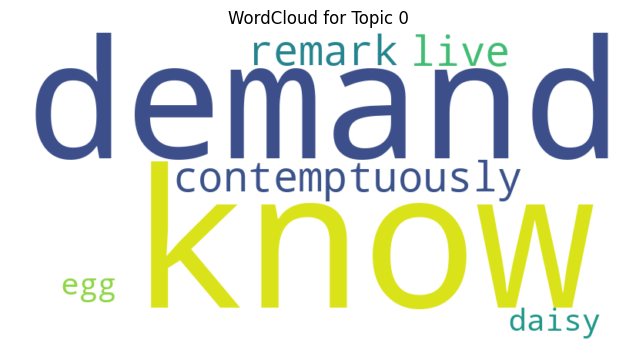

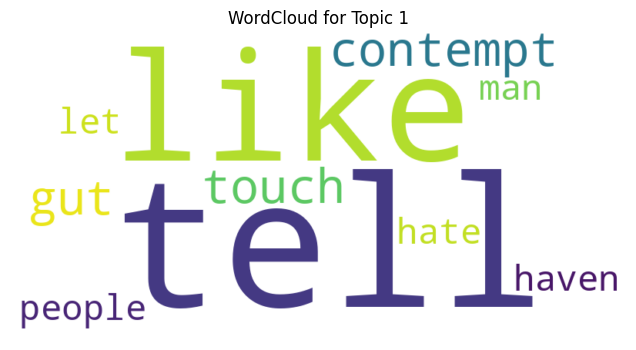

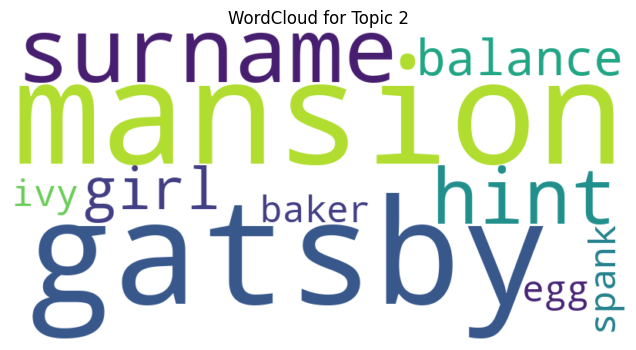

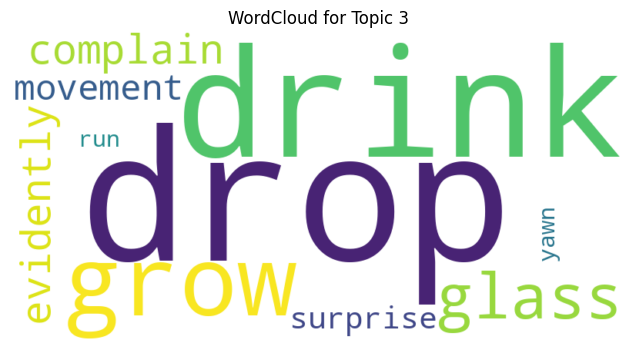

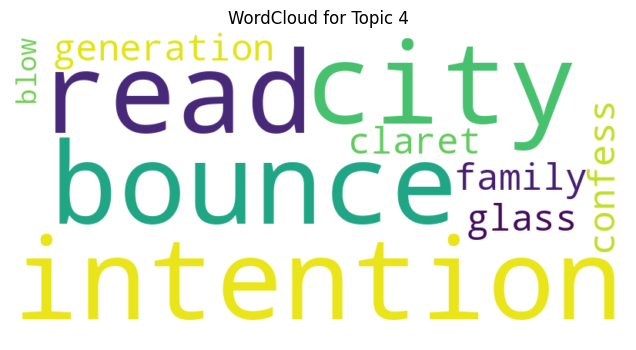

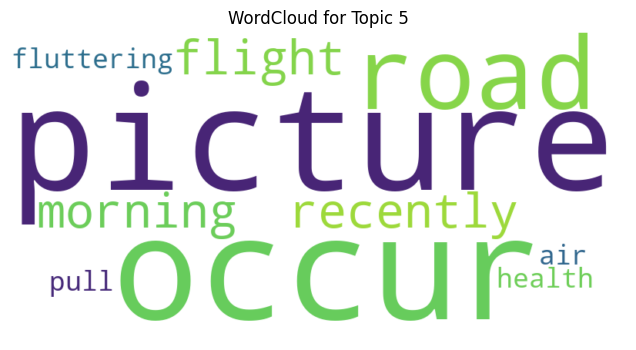

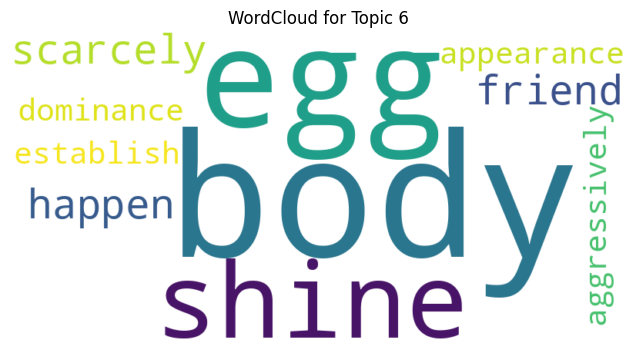

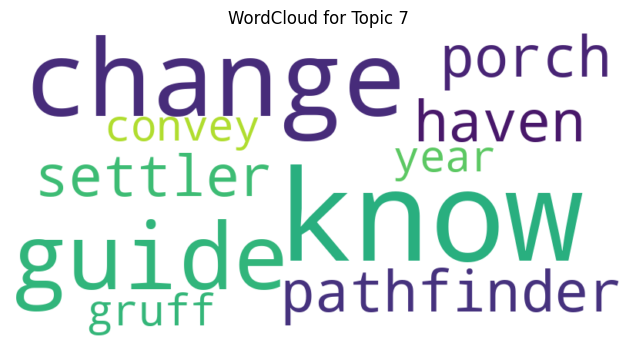

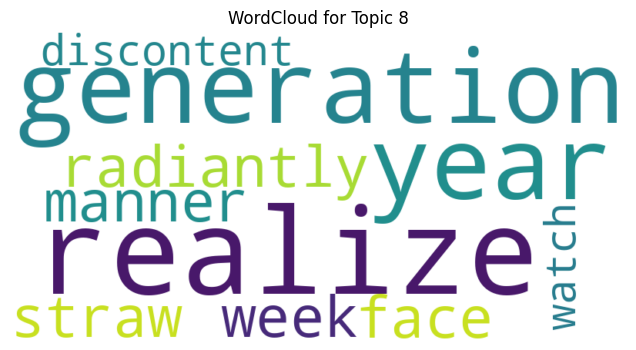

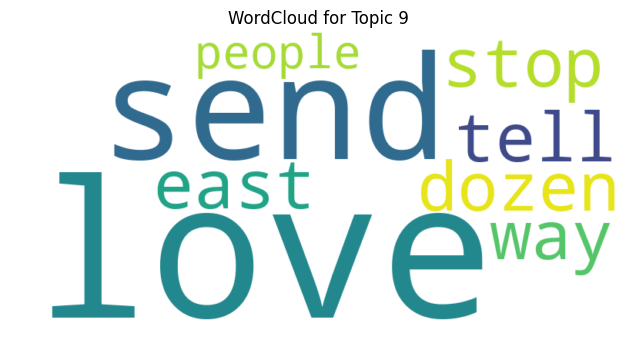

In [115]:
# Function to generate a word cloud for each topic
def create_wordcloud_for_topics(topic_terms):
    for i, topic in enumerate(topic_terms):
        # Extract the terms and weights for the current topic
        topic_words = dict((term, float(weight)) for term, weight in topic)

        # Generate the word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_words)

        # Display the word cloud
        plt.figure(figsize=(8, 4))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"WordCloud for Topic {i}")
        plt.show()

# Prepare the topic terms from your model output (show_topics)
def get_topic_terms(model_output):
    topic_terms = []
    for topic in model_output:
        # Extract each term and its weight from the string representation
        terms = topic[1].split(" + ")
        term_weight_pairs = [(term.split("*")[1].replace('"', ''), term.split("*")[0]) for term in terms]
        topic_terms.append(term_weight_pairs)
    return topic_terms

# Call the functions with your model output (assuming it's stored in `model_list[index].show_topics()` output)
topic_terms = get_topic_terms(model_list[index].show_topics())
create_wordcloud_for_topics(topic_terms)

<a id="BERTopic"></a>

# <div style="background-color: #FF5733; font-family: 'Gill Sans', sans-serif; font-size: 36px; color: #ffffff; text-align: center; border-radius: 20px; padding: 20px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2);"><b>  5. BERTopic </b></div>


In [42]:
# Need Access to Huggingface API key?

topic_model = BERTopic()
topics, probs = topic_model.fit_transform(smalldata.headline_text.values.tolist())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [118]:
%%time

# NOTE:

FULL_FLAG = True

if FULL_FLAG == True:
  # Run full data
  topics, probs = topic_model.fit_transform(df.headline_text.values.tolist())
else:
  # Test small data
  topics, probs = topic_model.fit_transform(smalldata.headline_text.values.tolist())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



CPU times: user 56.3 s, sys: 1.96 s, total: 58.2 s
Wall time: 1min 6s


In [116]:
topic_model.get_topic(0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



[('in', 0.09765104084010344),
 ('us', 0.08882676658300637),
 ('to', 0.056638620325927105),
 ('drug', 0.05205263634543152),
 ('bushfire', 0.05205263634543152),
 ('threat', 0.05205263634543152),
 ('blast', 0.05205263634543152),
 ('police', 0.05205263634543152),
 ('for', 0.05172882631546014),
 ('after', 0.04757512833523914)]

In [44]:
topic_model.get_document_info(smalldata.headline_text.values.tolist())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,lawyer claims aust govt has abandoned corby,-1,-1_to_in_with_of,"[to, in, with, of, for, the, on, youth, aust, ...",[smith becomes third australian to fall on bit...,to - in - with - of - for - the - on - youth -...,0.000000,False
1,singapore tells spouses of patients hiv status,1,1_on_to_of_industry,"[on, to, of, industry, future, and, carbon, fo...",[listen to the carbon farming initiative inter...,on - to - of - industry - future - and - carbo...,0.827003,False
2,iron ore price slumps to new five year low,-1,-1_to_in_with_of,"[to, in, with, of, for, the, on, youth, aust, ...",[smith becomes third australian to fall on bit...,to - in - with - of - for - the - on - youth -...,0.000000,False
3,youth crime prevention schemes share in funds,-1,-1_to_in_with_of,"[to, in, with, of, for, the, on, youth, aust, ...",[smith becomes third australian to fall on bit...,to - in - with - of - for - the - on - youth -...,0.000000,False
4,harry triguboff speaks to the business,-1,-1_to_in_with_of,"[to, in, with, of, for, the, on, youth, aust, ...",[smith becomes third australian to fall on bit...,to - in - with - of - for - the - on - youth -...,0.000000,False
...,...,...,...,...,...,...,...,...
95,the wa member of parliament electoral allowanc...,-1,-1_to_in_with_of,"[to, in, with, of, for, the, on, youth, aust, ...",[smith becomes third australian to fall on bit...,to - in - with - of - for - the - on - youth -...,0.000000,False
96,britain to appeal hicks passport decision,-1,-1_to_in_with_of,"[to, in, with, of, for, the, on, youth, aust, ...",[smith becomes third australian to fall on bit...,to - in - with - of - for - the - on - youth -...,0.000000,False
97,patel granted conditional bail,0,0_in_us_to_drug,"[in, us, to, drug, bushfire, threat, blast, po...",[us embassy attacked with explosive in montene...,in - us - to - drug - bushfire - threat - blas...,0.917151,False
98,labor negative political climate carbon policy,1,1_on_to_of_industry,"[on, to, of, industry, future, and, carbon, fo...",[listen to the carbon farming initiative inter...,on - to - of - industry - future - and - carbo...,1.000000,False


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



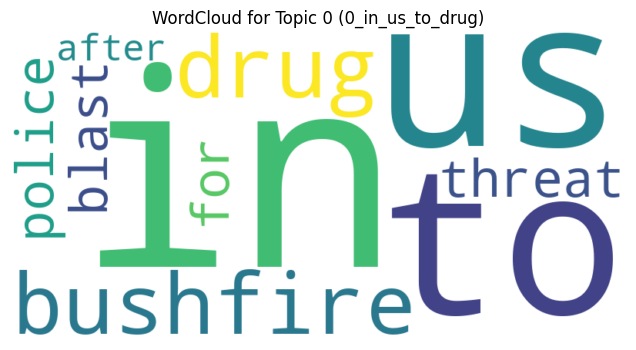

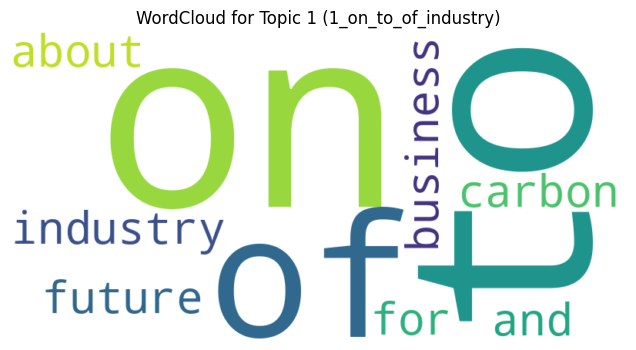

In [67]:
# Example setup function for document_info
def get_document_info(topic_model, documents):
    """
    Retrieve the document information for each document in the corpus,
    including topic assignments and top words.

    Parameters:
    - topic_model: Trained topic model instance with a method get_document_info
    - documents: List of documents (e.g., headlines or text data)

    Returns:
    - document_info: DataFrame with details for each document, including Topic, Name, and Top_n_words
    """
    # Obtain document information from the topic model
    document_info = topic_model.get_document_info(documents)
    return document_info

# Assuming smalldata.headline_text.values.tolist() is the list of documents
documents = smalldata.headline_text.values.tolist()

# Generate the document_info DataFrame
document_info = get_document_info(topic_model, documents)

# Now call the function to create word clouds for the top N topics
create_wordcloud_for_top_topics(document_info, top_n=10)


In [66]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to generate a word cloud for each of the top N topics
def create_wordcloud_for_top_topics(document_info, top_n=10):
    # Filter out invalid rows (with -1 in 'Topic' or 'Name') and sort by 'Probability' to prioritize important topics
    valid_document_info = document_info[(document_info['Topic'] != -1) & (document_info['Name'] != '-1')]
    top_topics = valid_document_info.sort_values(by='Probability', ascending=False).drop_duplicates('Topic').head(top_n)

    # Loop through each topic and generate word clouds
    for i, row in top_topics.iterrows():
        try:
            # Extract the top words for the current topic
            if isinstance(row['Top_n_words'], str):
                top_words = row['Top_n_words'].split(' - ')  # Assuming words are separated by " - "
                word_freq = {word: 1 for word in top_words}  # Assign equal weight to each word

                # Generate and display the word cloud
                wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
                plt.figure(figsize=(8, 4))
                plt.imshow(wordcloud, interpolation='bilinear')
                plt.axis('off')
                plt.title(f"WordCloud for Topic {row['Topic']} ({row['Name']})")
                plt.show()
            else:
                print(f"Skipping row {i}: 'Top_n_words' is not a string.")
        except Exception as e:
            print(f"Error processing row {i}: {e}")

# Example call assuming 'document_info' is loaded
create_wordcloud_for_top_topics(document_info, top_n=10)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



NameError: name 'document_info' is not defined

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


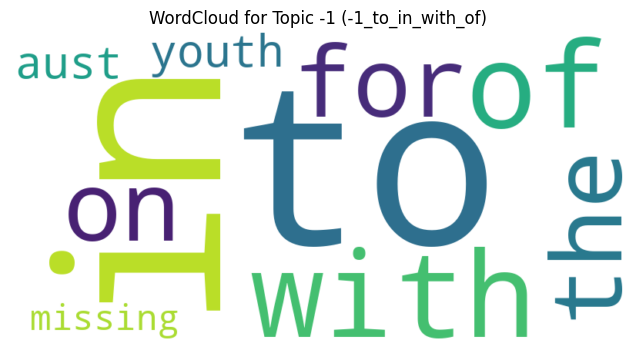

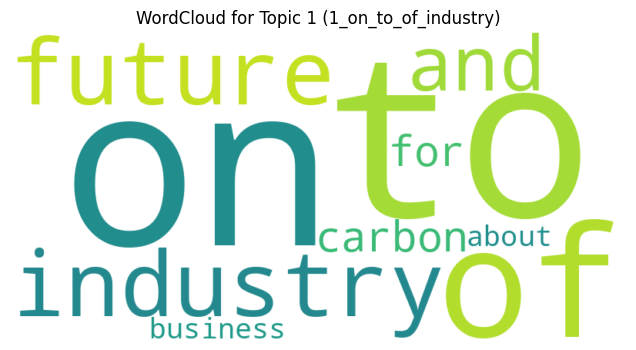

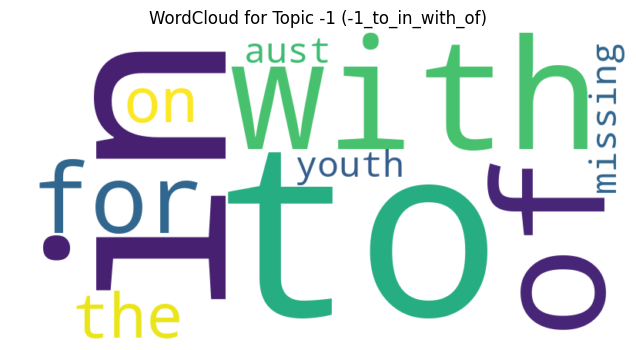

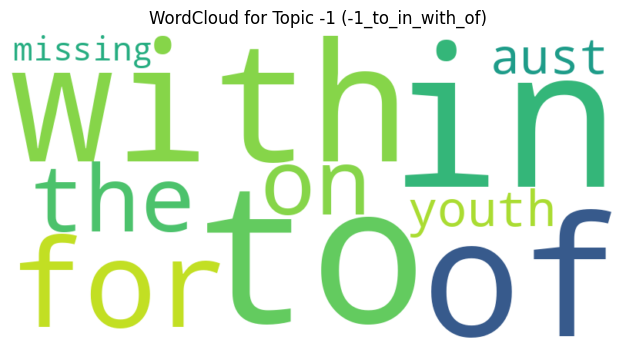

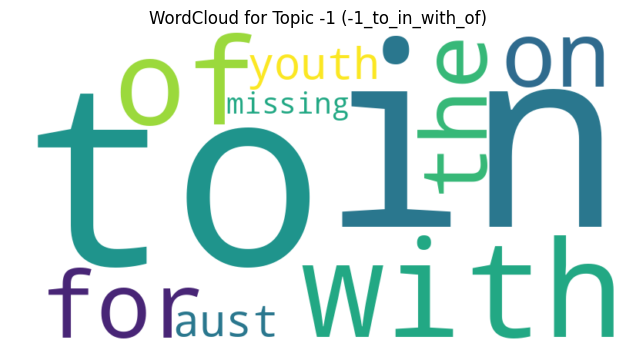

...

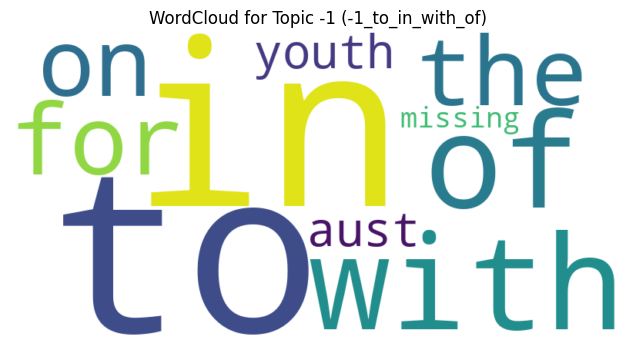

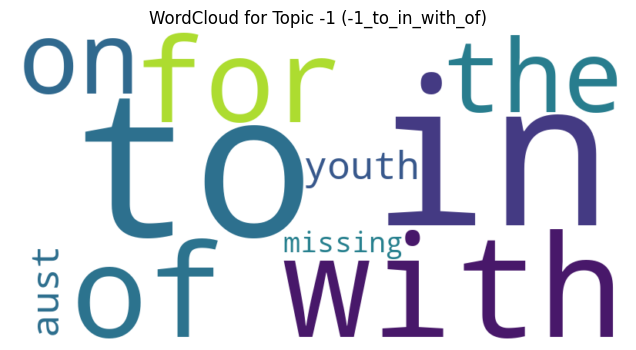

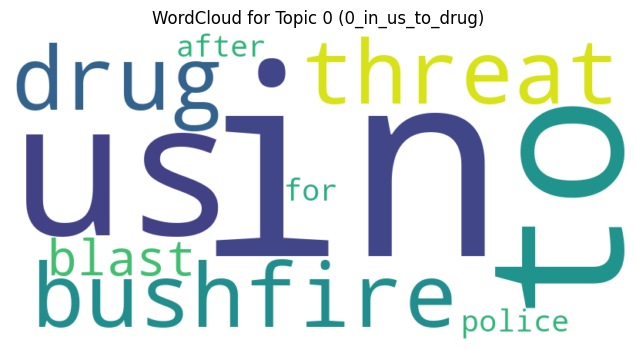

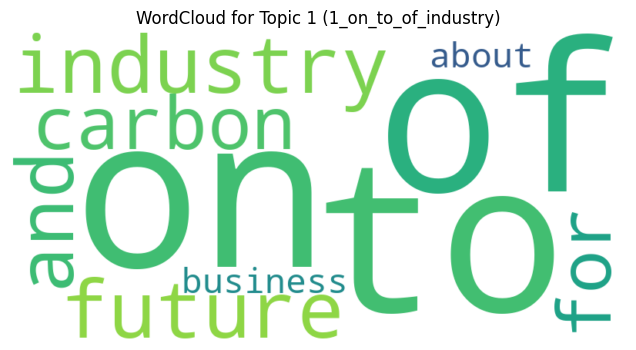

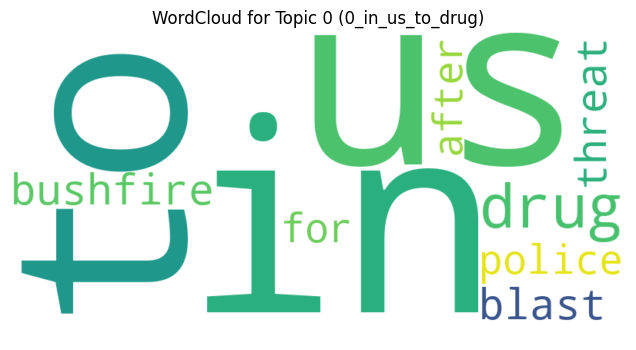

In [45]:
# Function to generate a word cloud for each topic
def create_wordcloud_for_topics(document_info):
    # Loop through each document and its associated topic
    for i, row in document_info.iterrows():
        # Extract the top words for the current topic
        top_words = row['Top_n_words'].split(' - ')  # Assuming the words are separated by " - "

        # Create a dictionary for word cloud input (you can adjust the word frequencies here if needed)
        word_freq = {word: 1 for word in top_words}  # Assign equal weight (frequency) to each word

        # Generate the word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

        # Display the word cloud
        plt.figure(figsize=(8, 4))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"WordCloud for Topic {row['Topic']} ({row['Name']})")
        plt.show()

# Call the function with the document_info DataFrame (you should have it stored in a variable)
create_wordcloud_for_topics(topic_model.get_document_info(smalldata.headline_text.values.tolist()))


In [65]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to generate a word cloud for each of the top N topics
def create_wordcloud_for_top_topics(document_info, top_n=10):
    # Filter out invalid rows and select only the first TOP_N unique topics
    valid_document_info = document_info[(document_info['Topic'] != -1) & (document_info['Name'] != '-1')]

    # Get the top N unique topics (assuming 'Topic' is categorical and ranked)
    top_topics = valid_document_info['Topic'].unique()[:top_n]
    filtered_document_info = valid_document_info[valid_document_info['Topic'].isin(top_topics)]

    # Loop through each document in the filtered set and generate word clouds
    for i, row in filtered_document_info.iterrows():
        try:
            # Check if 'Top_n_words' is a valid string and extract words
            if isinstance(row['Top_n_words'], str):
                top_words = row['Top_n_words'].split(' - ')  # Assuming words are separated by " - "
                word_freq = {word: 1 for word in top_words}  # Assign equal weight to each word

                # Generate and display the word cloud
                wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
                plt.figure(figsize=(8, 4))
                plt.imshow(wordcloud, interpolation='bilinear')
                plt.axis('off')
                plt.title(f"WordCloud for Topic {row['Topic']} ({row['Name']})")
                plt.show()
            else:
                print(f"Skipping row {i}: 'Top_n_words' is not a string.")
        except Exception as e:
            print(f"Error processing row {i}: {e}")

# Call the function with the document_info DataFrame and specify TOP_N=10
create_wordcloud_for_top_topics(document_info, top_n=10)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



NameError: name 'document_info' is not defined

<a id="GSDM"></a>

# <div style="background-color: #FF5733; font-family: 'Gill Sans', sans-serif; font-size: 36px; color: #ffffff; text-align: center; border-radius: 20px; padding: 20px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2);"><b>  6. GSDM </b></div>


In [48]:
reviews_lemmatized = headline_text_lemmatized

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [49]:
mgp = MovieGroupProcess(K=6, alpha=0.01, beta=0.01, n_iters=30)

vocab = set(x for review in headline_text_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(reviews_lemmatized, n_terms)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In stage 0: transferred 67 clusters with 6 clusters populated
In stage 1: transferred 45 clusters with 6 clusters populated
In stage 2: transferred 44 clusters with 6 clusters populated
In stage 3: transferred 47 clusters with 6 clusters populated
In stage 4: transferred 48 clusters with 6 clusters populated
In stage 5: transferred 40 clusters with 6 clusters populated
In stage 6: transferred 43 clusters with 6 clusters populated
In stage 7: transferred 40 clusters with 6 clusters populated
In stage 8: transferred 38 clusters with 6 clusters populated
In stage 9: transferred 35 clusters with 6 clusters populated
In stage 10: transferred 42 clusters with 6 clusters populated
In stage 11: transferred 42 clusters with 6 clusters populated
In stage 12: transferred 40 clusters with 6 clusters populated
In stage 13: transferred 40 clusters with 6 clusters populated
In stage 14: transferred 34 clusters with 6 clusters populated
In stage 15: transferred 37 clusters with 6 clusters populated
In

In [50]:
def top_words(cluster_word_distribution, top_cluster, values):
    for cluster in top_cluster:
        sort_dicts =sorted(mgp.cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
        print("\nCluster %s : %s"%(cluster,sort_dicts))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [51]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [17 17 20 15 13 18]

Most important clusters (by number of docs inside): [2 5 1 0 3 4]

Cluster 2 : [('report', 4), ('campaign', 2), ('consider', 2), ('miss', 2), ('deny', 2), ('officer', 2), ('tell', 2), ('future', 1), ('spouse', 1), ('patient', 1)]

Cluster 5 : [('prepare', 2), ('carbon', 2), ('interview', 2), ('advocate', 2), ('business', 1), ('lawyer', 1), ('claim', 1), ('govt', 1), ('abandon', 1), ('corby', 1)]

Cluster 1 : [('blame', 3), ('control', 2), ('warning', 2), ('man', 2), ('delay', 2), ('blast', 2), ('industry', 2), ('hick', 2), ('work', 2), ('terrorism', 1)]

Cluster 0 : [('rate', 2), ('rise', 2), ('risk', 2), ('raise', 2), ('reveal', 2), ('rba', 1), ('signal', 1), ('cut', 1), ('timely', 1), ('accolade', 1)]

Cluster 3 : [('business', 2), ('prompt', 2), ('youth', 2), ('speak', 2), ('police', 2), ('bushfire', 2), ('threat', 2), ('prevention', 1), ('scheme', 1), ('share', 1)]

Cluster 4 : [('change', 2), ('support', 2), ('break', 2), ('kill

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [52]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [53]:
def create_topics_dataframe(data_text=smalldata.headline_text,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=reviews_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Rating', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(reviews_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [54]:
result = create_topics_dataframe(data_text=smalldata.headline_text, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=reviews_lemmatized)
result.head(5)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Text,Topic,Rating,Lemma-text
0,lawyer claims aust govt has abandoned corby,type 2,NaN,"[lawyer, claim, govt, abandon, corby]"
1,singapore tells spouses of patients hiv status,type 1,NaN,"[tell, spouse, patient, status]"
2,iron ore price slumps to new five year low,type 6,NaN,"[iron, ore, price, slump, year]"
3,youth crime prevention schemes share in funds,type 5,NaN,"[youth, prevention, scheme, share, fund]"
4,harry triguboff speaks to the business,type 5,NaN,"[speak, business]"


In [55]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [56]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Text,Topic,Rating,Lemma-text,len
0,lawyer claims aust govt has abandoned corby,type 2,NaN,"[lawyer, claim, govt, abandon, corby]",7
1,singapore tells spouses of patients hiv status,type 1,NaN,"[tell, spouse, patient, status]",7
2,iron ore price slumps to new five year low,type 6,NaN,"[iron, ore, price, slump, year]",9
3,youth crime prevention schemes share in funds,type 5,NaN,"[youth, prevention, scheme, share, fund]",7
4,harry triguboff speaks to the business,type 5,NaN,"[speak, business]",6


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



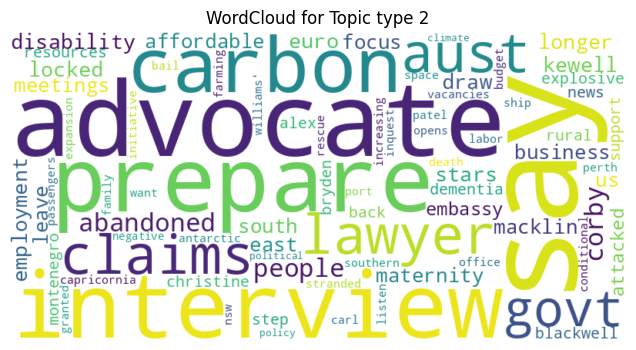

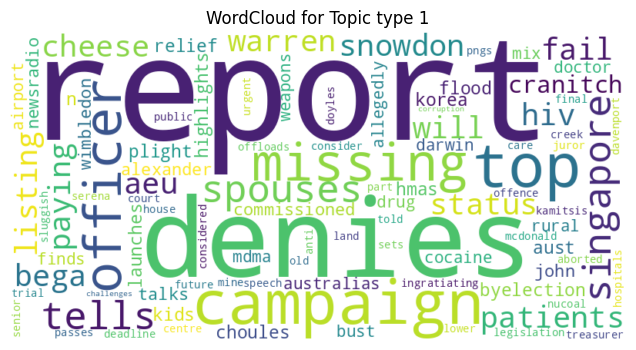

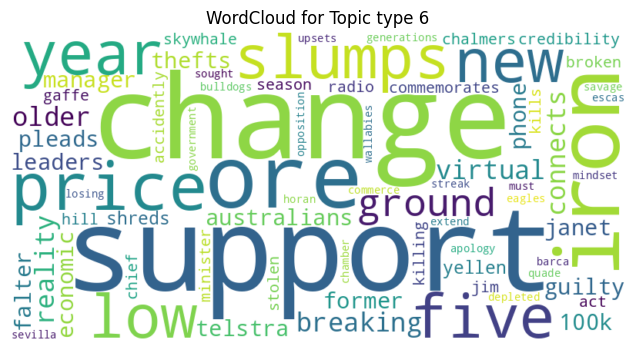

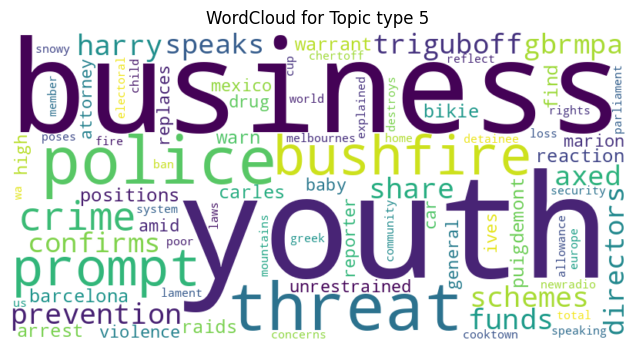

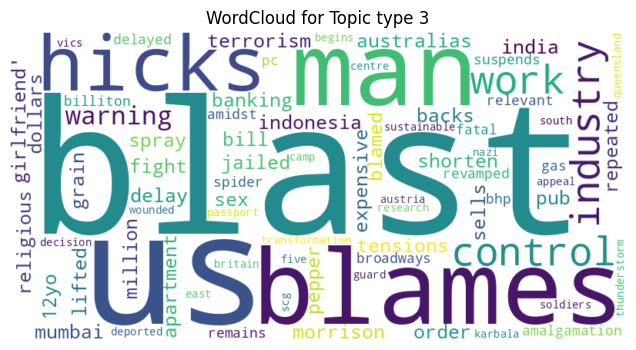

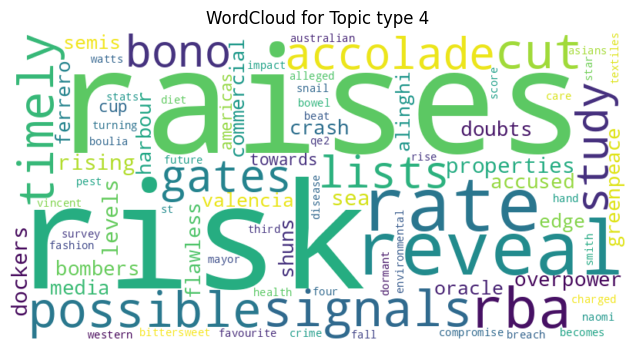

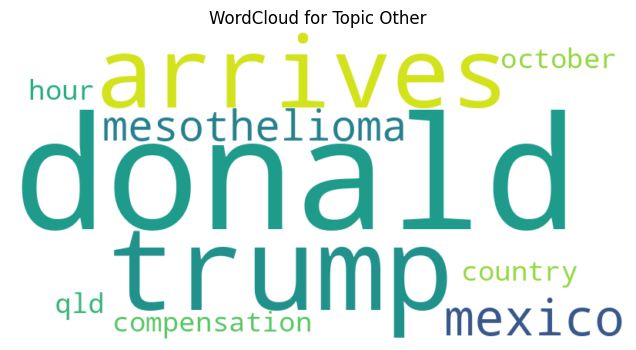

In [57]:
# Function to generate a word cloud for a given topic
def create_wordcloud_for_topic(text_data, topic_type):
    # Combine all text data for the given topic type
    combined_text = ' '.join(text_data)

    # Generate the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)

    # Display the word cloud
    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"WordCloud for Topic {topic_type}")
    plt.show()

# Iterate through the unique topics
for topic_type in result['Topic'].unique():
    # Filter the Text column for the current topic
    topic_texts = result[result['Topic'] == topic_type]['Text'].values

    # Generate and display the word cloud for the current topic
    create_wordcloud_for_topic(topic_texts, topic_type)

<a id="NMF"></a>

# <div style="background-color: #FF5733; font-family: 'Gill Sans', sans-serif; font-size: 36px; color: #ffffff; text-align: center; border-radius: 20px; padding: 20px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2);"><b>  7. Non-negative Matrix Factorization (NMF) </b></div>


In [58]:
from sklearn.decomposition import NMF


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [59]:
from sklearn.feature_extraction.text import CountVectorizer


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [60]:
vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')

X = vectorizer.fit_transform(smalldata.headline_text.values.tolist())


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [61]:
# Set the number of topics
num_topics = 10

# Initialize NMF model
nmf_model = NMF(n_components=num_topics, random_state=42)

# Fit the NMF model to the document-term matrix
nmf_W = nmf_model.fit_transform(X)  # Document-topic matrix
nmf_H = nmf_model.components_       # Topic-term matrix


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Display the Topics

In [62]:
# Get the vocabulary terms
terms = vectorizer.get_feature_names_out()

# Function to display the top words for each topic
def display_topics(H, terms, num_words=10):
    for i, topic in enumerate(H):
        print(f"Topic {i}:")
        print(", ".join([terms[j] for j in topic.argsort()[:-num_words - 1:-1]]))
        print()

# Display the topics
display_topics(nmf_H, terms, num_words=10)


Topic 0:
report, aust, campaign, future, blames, blast, bushfire, business, australias, drug

Topic 1:
east, south, business, support, blames, carbon, man, australias, blast, bushfire

Topic 2:
work, blast, centre, youth, australias, blames, bushfire, business, campaign, carbon

Topic 3:
missing, care, centre, report, denies, future, work, rural, carbon, crime

Topic 4:
mexico, drug, police, youth, cup, crime, control, centre, care, carbon

Topic 5:
control, hicks, carbon, aust, drug, australias, blames, blast, bushfire, business

Topic 6:
raises, risk, bushfire, carbon, cup, crime, control, centre, care, youth

Topic 7:
australias, rural, man, support, carbon, risk, youth, crime, control, centre

Topic 8:
threat, bushfire, cup, industry, blames, carbon, police, campaign, blast, denies

Topic 9:
youth, crime, police, cup, industry, blames, man, support, future, care



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## View Document-Topic Distribution

In [63]:
# Create a DataFrame to display document-topic distribution
doc_topic_df = pd.DataFrame(nmf_W, columns=[f"Topic {i}" for i in range(num_topics)])

# Display the topic distribution for the first document
print(doc_topic_df.iloc[0])


Topic 0    2.237093e-01
Topic 1    0.000000e+00
Topic 2    0.000000e+00
Topic 3    0.000000e+00
Topic 4    0.000000e+00
Topic 5    1.378675e-50
Topic 6    0.000000e+00
Topic 7    0.000000e+00
Topic 8    0.000000e+00
Topic 9    0.000000e+00
Name: 0, dtype: float64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



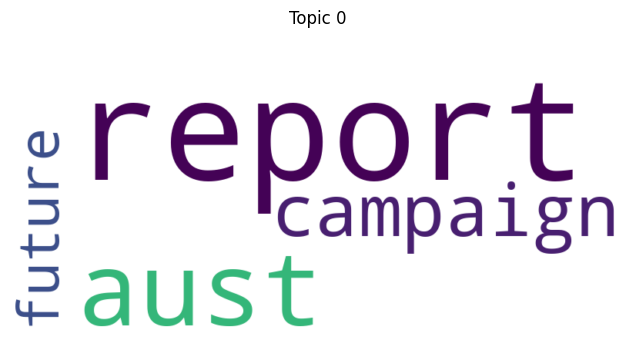

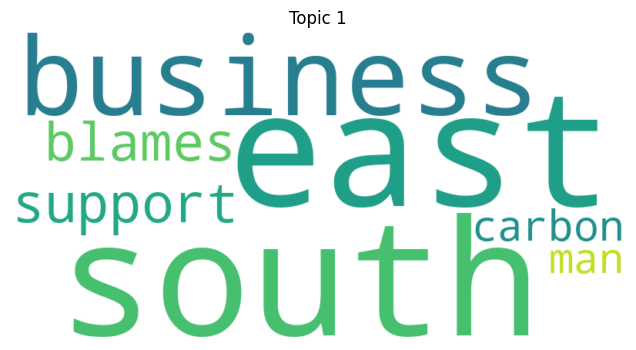

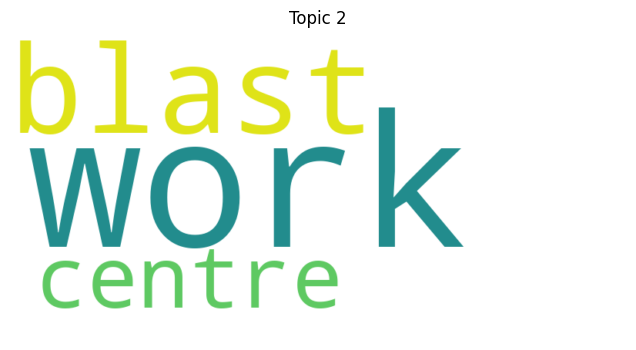

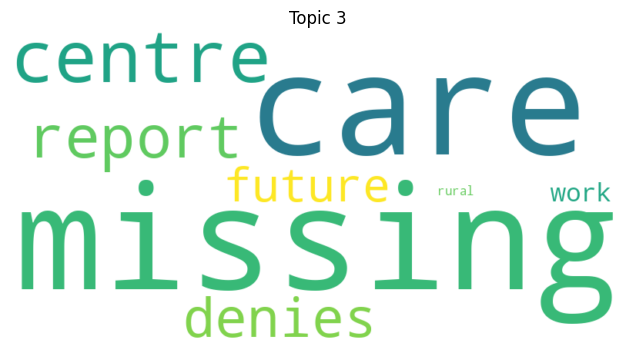

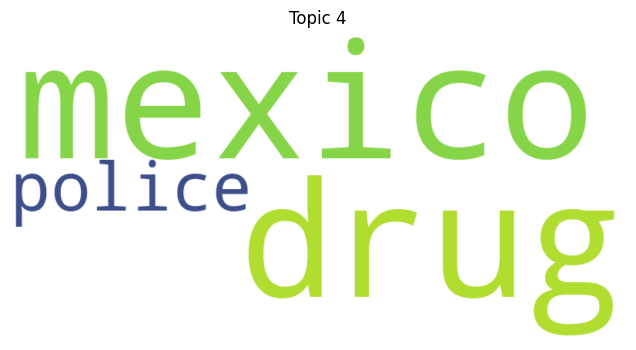

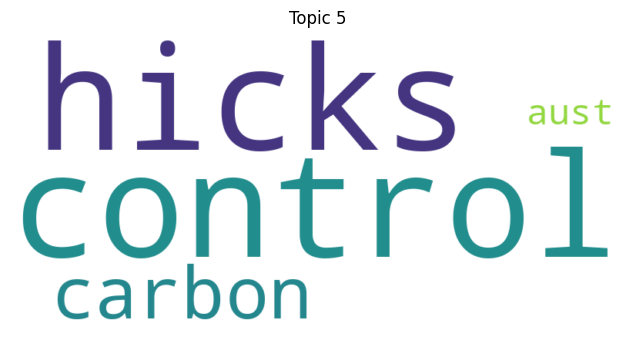

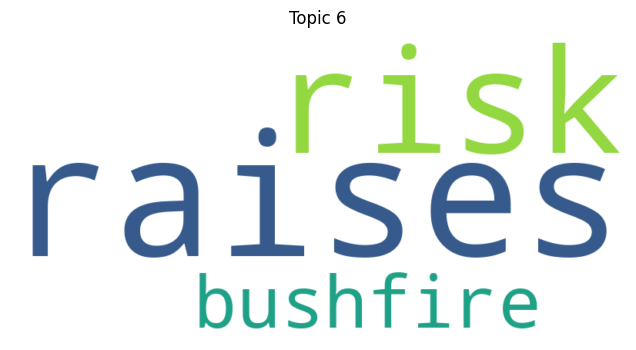

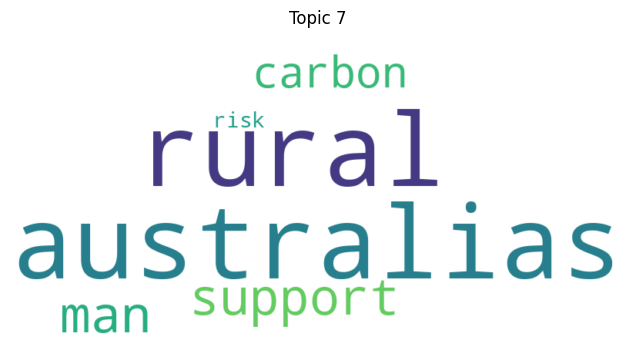

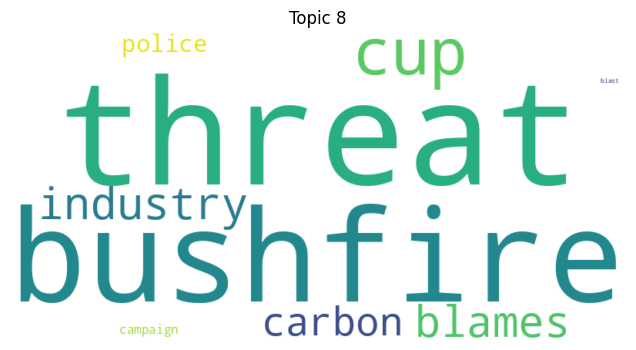

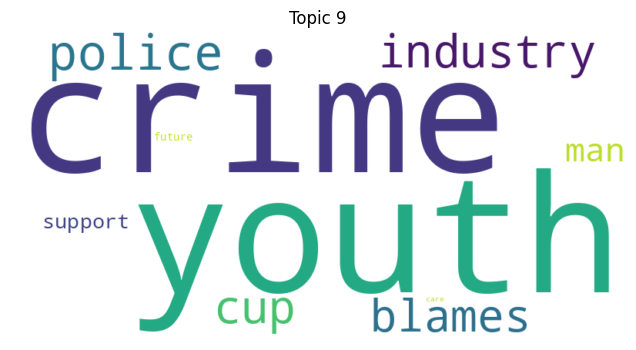

In [64]:

# Function to generate a word cloud for each topic
def create_wordcloud_for_topics(H, terms, num_topics=10):
    for i, topic in enumerate(H[:num_topics]):
        # Create a dictionary of terms and their weights
        topic_terms = {terms[j]: topic[j] for j in topic.argsort()[:-num_topics - 1:-1]}

        # Generate the word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_terms)

        # Display the word cloud
        plt.figure(figsize=(8, 4))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Topic {i}")
        plt.show()

# Call the function to display word clouds for topics
create_wordcloud_for_topics(nmf_H, terms, num_topics=10)